## **🏦 Bank Loan Portfolio Project** - Classification Project

#### **Project Goal -**
The goal of this project is to study bank loan data to understand why some customers do not repay loans and to help the bank decide who should get a loan and who should not.

The project helps the bank:
- Give loans to the right customers
- Reduce loan defaults
- Make better and safer loan decisions

In [3]:
# Importing necessary libraries

import pandas as pd     # for data cleaning, filtering and manipulation
import numpy as np           # numpy used for numerical computing
import seaborn as sns           # for advance and beautiful visualizations
import matplotlib.pyplot as plt     # for creating visualizations
%matplotlib inline 
from ydata_profiling import ProfileReport     # for generating profile report     
import plotly.express as px         # interactive and web based plotting library in python
import warnings                 # for supressing warning messages during code execution
warnings.filterwarnings("ignore")
pd.set_option('display.max_columns', None)

#### **Description of Libraries**
- **Pandas** - Pandas is used for data analysis and handling tabular data like Excel.
It provides easy tools to load, clean, and explore data using DataFrames.
- **Numpy** - NumPy is a Python library used for fast mathematical and array operations.
It helps in working with large datasets using arrays, matrices, and functions.
- **Seaborn** - Seaborn is a Python library for making beautiful and simple statistical charts.
It is built on top of Matplotlib and works well with Pandas.
- **Matplotlib** - Matplotlib is used to create basic graphs like line, bar, and pie charts.
It helps in visualizing data in static and simple formats.
- **Plotly** - Plotly is a library for creating interactive and web-based charts.
It is used when you want zoomable and clickable graphs.
- **%matplotlib inline** - This is used in Jupyter Notebook to show plots right below your code cell.
It helps display Matplotlib charts inside the notebook.
warnings (import warnings)
- **import warnings** - import warnings is used to manage or ignore warning messages in Python.
It helps keep output clean and readable during code execution.
- **ydata_profiling** - ydata_profiling quickly creates an automatic EDA report from your data.
It gives summaries, graphs, and insights in one HTML file.

#### **Loading Dataset**

In [6]:
# Loading dataaset using .read_csv() method of pandas

df = pd.read_csv("C:\\Users\\HP\\OneDrive\\Documents\\Bank_Loan_Portfolio.csv")

In [7]:
# Displaying first five records from the dataframe

df.head()

,Loan_ID,Application_Date,City,Region,Age,Employment_Type,Income,Loan_Amount,Loan_Tenure_Months,Interest_Rate_Percent,Credit_Score,Debt_To_Income_Ratio,Approval_Status,Default_Flag,Loan_Status,Customer_Rating,Risk_Category
0,LN102453,2023-08-13,Mumbai,West,43,Self-Employed,90322.0,980052.0,84,10.92,672.0,0.185,Approved,0,Active,4.1,Medium
1,LN100671,2024-11-26,Hyderabad,South,28,Salaried,32617.0,488350.0,54,9.99,698.0,0.345,Approved,0,Paid,4.6,Medium
2,LN100884,2024-03-07,Mumbai,West,34,Business,86468.0,NaN,53,11.56,709.0,0.422,Rejected,0,Rejected,4.4,Medium
3,LN100618,2023-04-07,Mumbai,West,33,Self-Employed,110760.0,1298938.0,59,8.36,730.0,0.243,Approved,0,Active,5.0,Low
4,LN100344,2023-05-30,Mumbai,West,37,Salaried,141338.0,1627058.0,110,10.14,767.0,0.161,Approved,0,Active,4.5,Low


#### 💸 **Dataset Overview**
This dataset contains information about bank loan applications collected during 2023–2024, where each row represents one customer’s loan application. It includes customer details such as age, city, region, employment type, and monthly income, along with loan-related information like loan amount, tenure, and interest rate. The dataset also provides financial risk indicators such as credit score and debt-to-income ratio, which are important for assessing a customer’s ability to repay a loan. The outcome of each application is captured through approval status, loan status, and a target variable called Default_Flag, which indicates whether a customer defaulted on the loan or not. The data has some missing values, a few outliers, and a highly imbalanced target variable, making it suitable for data cleaning, exploratory analysis, and machine learning modeling to predict loan default risk and support better loan approval decisions.

In [9]:
# Displaying last five records from the dataframe

df.head()

,Loan_ID,Application_Date,City,Region,Age,Employment_Type,Income,Loan_Amount,Loan_Tenure_Months,Interest_Rate_Percent,Credit_Score,Debt_To_Income_Ratio,Approval_Status,Default_Flag,Loan_Status,Customer_Rating,Risk_Category
0,LN102453,2023-08-13,Mumbai,West,43,Self-Employed,90322.0,980052.0,84,10.92,672.0,0.185,Approved,0,Active,4.1,Medium
1,LN100671,2024-11-26,Hyderabad,South,28,Salaried,32617.0,488350.0,54,9.99,698.0,0.345,Approved,0,Paid,4.6,Medium
2,LN100884,2024-03-07,Mumbai,West,34,Business,86468.0,NaN,53,11.56,709.0,0.422,Rejected,0,Rejected,4.4,Medium
3,LN100618,2023-04-07,Mumbai,West,33,Self-Employed,110760.0,1298938.0,59,8.36,730.0,0.243,Approved,0,Active,5.0,Low
4,LN100344,2023-05-30,Mumbai,West,37,Salaried,141338.0,1627058.0,110,10.14,767.0,0.161,Approved,0,Active,4.5,Low


In [10]:
# Displaying 5 random sample records from the dataframe

df.sample(5)

,Loan_ID,Application_Date,City,Region,Age,Employment_Type,Income,Loan_Amount,Loan_Tenure_Months,Interest_Rate_Percent,Credit_Score,Debt_To_Income_Ratio,Approval_Status,Default_Flag,Loan_Status,Customer_Rating,Risk_Category
1220,LN102699,2024-12-04,Hyderabad,South,31,Salaried,116206.0,1539157.0,74,8.64,751.0,0.231,approved,0,Active,5.0,Low
1835,LN101194,2024-01-14,hyderabad,South,21,Salaried,64041.0,407168.0,57,10.90,736.0,0.143,Approved,1,Defaulted,1.8,Low
333,LN100387,2024-01-31,Hyderabad,South,24,Salaried,64070.0,1055480.0,51,7.50,662.0,0.378,Approved,0,Active,4.8,Medium
2308,LN102488,2023-07-27,Delhi,North,46,Self-Employed,114573.0,977940.0,76,9.56,641.0,0.150,Rejected,0,Rejected,4.3,High
1343,LN100311,2023-04-29,Pune,West,30,Business,119200.0,1286770.0,78,12.39,625.0,0.202,Approved,0,Active,4.9,High


In [11]:
# Getting the list of column names from the dataframe 

column_names_list = df.columns.tolist()
print(column_names_list)

['Loan_ID', 'Application_Date', 'City', 'Region', 'Age', 'Employment_Type', 'Income', 'Loan_Amount', 'Loan_Tenure_Months', 'Interest_Rate_Percent', 'Credit_Score', 'Debt_To_Income_Ratio', 'Approval_Status', 'Default_Flag', 'Loan_Status', 'Customer_Rating', 'Risk_Category']


### **Column Description**
- **`Loan_ID`** - Unique loan identifier.
- **`Application_Date`** - Date of application (YYYY-MM-DD).
- **`City`** - Applicant city (6-city set).
- **`Region`** - Geographic region derived from city.
- **`Age`** - Applicant age.
- **`Employment_Type`** - Salaried | Self-Employed | Business.
- **`Income (INR)`** - Monthly income.
- **`Loan_Amount (INR)`** - Approved amount; correlated with Income and purpose.
- **`Loan_Tenure_Months`** - Tenure in months.
- **`Interest_Rate_Percent`** - Annual interest rate (%).
- **`Credit_Score (300–900)`** - Higher is better.
- **`Debt_To_Income_Ratio`** - EMI / Income.
- **`Approval_Status`** - Approved | Rejected.
- **`Default_Flag`** - 1 if defaulted (only meaningful when approved)(Applicant repay or missed payments).
- **`Loan_Status`** - Active | Paid | Defaulted | Rejected.
- **`Customer_Rating (1–5)`** - Internal score.
- **`Risk_Category`** - Low | Medium | High.

In [13]:
# Checking shape of the dataframe

df.shape

(3000, 17)

**Dataset has 3000 records with 17 columns.**

#### **Generating Profile Report**

In [16]:
# Generating profile report before cleaning the dataset

Profile = ProfileReport(df)
Profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 17/17 [00:00<00:00, 75.44it/s][A


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [17]:
# Checking datatypes of all columns in the dataframe

df.dtypes

Loan_ID                   object
Application_Date          object
City                      object
Region                    object
Age                        int64
Employment_Type           object
Income                   float64
Loan_Amount              float64
Loan_Tenure_Months         int64
Interest_Rate_Percent    float64
Credit_Score             float64
Debt_To_Income_Ratio     float64
Approval_Status           object
Default_Flag               int64
Loan_Status               object
Customer_Rating          float64
Risk_Category             object
dtype: object

In [18]:
# Converting datatype of Application_Date from object to datetime

df['Application_Date'] = pd.to_datetime(df['Application_Date'])

In [19]:
# Extracting columns from the Application_Date column

# Creating new features Year, Month, Day, Weekday, Weekend from 'Date' feature

df['Year'] = df['Application_Date'].dt.year       # year from the date
df['Month'] = df['Application_Date'].dt.month          # month from the date

In [20]:
# Dropping Loan_ID because we will not use it in analysis 
df.drop(columns=['Loan_ID'], axis=1, inplace=True)

# Dropping Application_Date column because we had extracted new features from it
df.drop(columns=['Application_Date'], axis=1, inplace=True)

In [21]:
# Here in column Default_Flag and IsWeekend values are 0 and 1 we convert them to yes and no

df['Default_Flag'] = df['Default_Flag'].replace(0, 'No')
df['Default_Flag'] = df['Default_Flag'].replace(1, 'Yes')

In [22]:
# Checking unique values in each categorical column

# Creating list of categorical columns
cat_col = []
for col in df.columns:
    if df[col].dtype == 'object':
        cat_col.append(col)

for i, column in enumerate(cat_col, start=1):
    print(f'{i}. Unique values in {column} are {df[column].unique()}.\n')

1. Unique values in City are ['Mumbai' 'Hyderabad' 'Chennai' 'delhi' 'Delhi' 'Pune' 'Bengaluru'
 'mumbai' 'hyderabad' 'pune' 'chennai' 'bengaluru'].

2. Unique values in Region are ['West' 'South' 'North'].

3. Unique values in Employment_Type are ['Self-Employed' 'Salaried' 'Business' 'salaried' nan 'business'
 'self-employed'].

4. Unique values in Approval_Status are ['Approved' 'Rejected' 'approved' 'rejected'].

5. Unique values in Default_Flag are ['No' 'Yes'].

6. Unique values in Loan_Status are ['Active' 'Paid' 'Rejected' 'rejected' 'Defaulted' 'paid' 'active'
 'defaulted'].

7. Unique values in Risk_Category are ['Medium' 'Low' 'high' 'High' 'low' 'medium'].



In [23]:
# In this dataset same categories in some categorical feature are in titlecase as well as lowercase, so here we convert those lowercase categories to titlecase

df['City'] = df['City'].str.title()
df['Employment_Type'] = df['Employment_Type'].str.title()
df['Approval_Status'] = df['Approval_Status'].str.title()
df['Loan_Status'] = df['Loan_Status'].str.title()
df['Risk_Category'] = df['Risk_Category'].str.title()

In [24]:
# Checking unique values in each categorical column after changing them in titlecase

for i, column in enumerate(cat_col, start=1):
    print(f'{i}. Unique values in {column} are {df[column].unique()}.\n')

1. Unique values in City are ['Mumbai' 'Hyderabad' 'Chennai' 'Delhi' 'Pune' 'Bengaluru'].

2. Unique values in Region are ['West' 'South' 'North'].

3. Unique values in Employment_Type are ['Self-Employed' 'Salaried' 'Business' nan].

4. Unique values in Approval_Status are ['Approved' 'Rejected'].

5. Unique values in Default_Flag are ['No' 'Yes'].

6. Unique values in Loan_Status are ['Active' 'Paid' 'Rejected' 'Defaulted'].

7. Unique values in Risk_Category are ['Medium' 'Low' 'High'].



#### **Checking Missing Values**

In [26]:
# Checking total number of missing values present in the dataset

df.isnull().sum()

City                       0
Region                     0
Age                        0
Employment_Type          120
Income                   120
Loan_Amount              121
Loan_Tenure_Months         0
Interest_Rate_Percent      0
Credit_Score             121
Debt_To_Income_Ratio       0
Approval_Status            0
Default_Flag               0
Loan_Status                0
Customer_Rating            0
Risk_Category              0
Year                       0
Month                      0
dtype: int64

**Dataset has 120 missing values in Employment_Type and Income, 121 missing values in Loan_Amount and Credit_Score.**

In [28]:
# Records with missing values in Income column

df[df['Income'].isna()]

,City,Region,Age,Employment_Type,Income,Loan_Amount,Loan_Tenure_Months,Interest_Rate_Percent,Credit_Score,Debt_To_Income_Ratio,Approval_Status,Default_Flag,Loan_Status,Customer_Rating,Risk_Category,Year,Month
28,Bengaluru,South,35,Business,NaN,1093595.0,76,8.93,667.0,0.207,Approved,No,Active,4.4,Medium,2023,5
32,Bengaluru,South,43,Salaried,NaN,NaN,89,12.36,676.0,0.088,Rejected,No,Rejected,4.3,Medium,2023,12
59,Delhi,North,21,Self-Employed,NaN,1110054.0,85,9.92,672.0,0.221,Approved,Yes,Defaulted,1.5,Medium,2023,8
127,Delhi,North,31,Business,NaN,396578.0,74,12.37,670.0,0.106,Approved,No,Active,4.1,Medium,2023,8
128,Bengaluru,South,43,Self-Employed,NaN,1171502.0,94,13.64,706.0,0.211,Rejected,No,Rejected,5.0,Medium,2024,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2762,Hyderabad,South,37,Business,NaN,1087052.0,91,12.44,717.0,0.161,Approved,No,Active,4.6,Medium,2023,2
2854,Chennai,South,44,Salaried,NaN,1277157.0,85,10.98,808.0,0.178,Approved,No,Active,4.8,Low,2024,2
2864,Delhi,North,41,Business,NaN,698372.0,91,10.17,NaN,0.095,Rejected,No,Rejected,4.7,Low,2023,3
2866,Hyderabad,South,32,Business,NaN,1164808.0,74,10.94,669.0,0.208,Rejected,No,Rejected,4.1,Medium,2023,7


In [29]:
# Filling missing value of column Income with median

df['Income'] = df['Income'].fillna(df['Income'].median())

In [30]:
# We have 121 missing values in Credit_Score and these are Missing at Random(MAR) type of missing values because missing credit score is depend on risk category column in the dataset
# So we fill this missing values with median(because dataset has outliers) of that particular category using groupby and fillna

df['Credit_Score'] = df['Credit_Score'].fillna(df['Risk_Category'].map(df.groupby('Risk_Category')['Credit_Score'].median()))

In [31]:
# Same for Loan amount it has missing values and Loan amount column is highly correlated with Income column in the dataset
# This are also Missing at Random(MAR) type of missing values

# Creating new column income category, so that we can identify in which category applicant's income belongs
# .qcut() method divides data into equal sized bins, it automatically sort data in ascending order and then divides the data
df['Income_Category'] = pd.qcut(df['Income'], 4, labels = ['Low','Medium','High','Very High']) 

# Filling missing values with median of column Loan_Amount
df['Loan_Amount'] = df['Loan_Amount'].fillna(df.groupby('Income_Category')['Loan_Amount'].transform('median'))

In [32]:
# Missing values in Employment_Type column are of Missing Completely at Random(MCAR) type because it is just data entry mistake
# Here we are filling with most frequent value of that column(mode)

df['Employment_Type'].fillna(df['Employment_Type'].mode()[0], inplace=True)

In [33]:
# Checking missing values after handling

df.isnull().sum()

City                     0
Region                   0
Age                      0
Employment_Type          0
Income                   0
Loan_Amount              0
Loan_Tenure_Months       0
Interest_Rate_Percent    0
Credit_Score             0
Debt_To_Income_Ratio     0
Approval_Status          0
Default_Flag             0
Loan_Status              0
Customer_Rating          0
Risk_Category            0
Year                     0
Month                    0
Income_Category          0
dtype: int64

**`Now dataset has no missing values in any column.`**

In [35]:
# Cheking total number of duplicate records present in the dataset

df.duplicated().sum()

44

In [36]:
# Displaying duplicate records (includes both duplicate records)

duplicate_records = df[df.duplicated(keep=False)]
duplicate_records

,City,Region,Age,Employment_Type,Income,Loan_Amount,Loan_Tenure_Months,Interest_Rate_Percent,Credit_Score,Debt_To_Income_Ratio,Approval_Status,Default_Flag,Loan_Status,Customer_Rating,Risk_Category,Year,Month,Income_Category
13,Chennai,South,28,Salaried,105710.0,570605.0,43,9.340000,790.0,0.148,Approved,No,Paid,4.5,Low,2024,2,Very High
57,Chennai,South,39,Salaried,60401.0,257897.0,66,11.520000,786.0,0.088,Approved,No,Active,5.0,Low,2024,5,Low
102,Chennai,South,42,Salaried,75214.0,476919.0,69,9.370000,737.0,0.119,Approved,No,Active,5.0,Low,2024,6,Medium
132,Chennai,South,42,Business,44307.0,489558.0,78,40.447347,623.0,0.204,Rejected,No,Rejected,4.8,High,2023,12,Low
183,Hyderabad,South,37,Business,90066.0,629868.0,107,10.320000,688.0,0.100,Rejected,No,Rejected,4.1,Medium,2023,9,High
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2773,Pune,West,39,Business,67690.0,1176702.0,91,10.920000,702.0,0.282,Rejected,No,Rejected,5.0,Medium,2024,5,Medium
2822,Bengaluru,South,27,Self-Employed,100613.0,861637.0,88,13.000000,686.0,0.151,Rejected,No,Rejected,3.6,Medium,2023,12,High
2834,Chennai,South,28,Salaried,105710.0,570605.0,43,9.340000,790.0,0.148,Approved,No,Paid,4.5,Low,2024,2,Very High
2868,Chennai,South,21,Salaried,88743.0,1162186.0,34,10.910000,753.0,0.450,Rejected,No,Rejected,5.0,Medium,2023,11,High


In [37]:
# Displaying first five rows

df.head()

,City,Region,Age,Employment_Type,Income,Loan_Amount,Loan_Tenure_Months,Interest_Rate_Percent,Credit_Score,Debt_To_Income_Ratio,Approval_Status,Default_Flag,Loan_Status,Customer_Rating,Risk_Category,Year,Month,Income_Category
0,Mumbai,West,43,Self-Employed,90322.0,980052.0,84,10.92,672.0,0.185,Approved,No,Active,4.1,Medium,2023,8,High
1,Hyderabad,South,28,Salaried,32617.0,488350.0,54,9.99,698.0,0.345,Approved,No,Paid,4.6,Medium,2024,11,Low
2,Mumbai,West,34,Business,86468.0,954165.0,53,11.56,709.0,0.422,Rejected,No,Rejected,4.4,Medium,2024,3,High
3,Mumbai,West,33,Self-Employed,110760.0,1298938.0,59,8.36,730.0,0.243,Approved,No,Active,5.0,Low,2023,4,Very High
4,Mumbai,West,37,Salaried,141338.0,1627058.0,110,10.14,767.0,0.161,Approved,No,Active,4.5,Low,2023,5,Very High


In [38]:
# Dropping duplicate records from the dataframe

df.drop_duplicates(keep='first', inplace=True)

In [39]:
# Cheking duplicates after handling them

df.duplicated().sum()

0

**`Now duplicate records are not present in this dataset.`**

In [41]:
# Checking value_counts() for each categorical column

for i, column in enumerate(cat_col, start=1):
    print(f'{i}. Value counts in {df[column].value_counts()}.\n')

1. Value counts in City
Delhi        533
Mumbai       503
Pune         491
Chennai      490
Bengaluru    480
Hyderabad    459
Name: count, dtype: int64.

2. Value counts in Region
South    1429
West      994
North     533
Name: count, dtype: int64.

3. Value counts in Employment_Type
Salaried         1773
Self-Employed     603
Business          580
Name: count, dtype: int64.

4. Value counts in Approval_Status
Approved    1978
Rejected     978
Name: count, dtype: int64.

5. Value counts in Default_Flag
No     2753
Yes     203
Name: count, dtype: int64.

6. Value counts in Loan_Status
Active       1077
Rejected      978
Paid          698
Defaulted     203
Name: count, dtype: int64.

7. Value counts in Risk_Category
Medium    1348
Low        941
High       667
Name: count, dtype: int64.



In [42]:
# Displaying the statistical summary of numerical columns in the dataframe

df.describe()

,Age,Income,Loan_Amount,Loan_Tenure_Months,Interest_Rate_Percent,Credit_Score,Debt_To_Income_Ratio,Customer_Rating,Year,Month
count,2956.000000,2956.000000,2.956000e+03,2956.00000,2956.000000,2956.000000,2956.000000,2956.000000,2956.000000,2956.000000
mean,34.182003,84537.771820,9.123008e+05,75.10318,11.471198,694.389208,0.213129,4.500372,2023.512855,6.444858
std,6.765896,30805.982955,6.864649e+05,21.39927,5.865205,57.037001,0.148252,0.725104,0.499919,3.432206
min,21.000000,20000.000000,1.000000e+05,12.00000,7.500000,512.000000,0.050000,1.300000,2023.000000,1.000000
25%,29.000000,63520.000000,5.717568e+05,60.00000,9.850000,656.000000,0.142000,4.400000,2023.000000,3.000000
50%,34.000000,84513.500000,8.556990e+05,76.00000,10.710000,692.000000,0.186000,4.700000,2024.000000,6.000000
75%,39.000000,104887.000000,1.128167e+06,90.00000,11.590000,734.000000,0.245000,5.000000,2024.000000,9.000000
max,57.000000,202962.000000,9.126093e+06,141.00000,72.676822,887.000000,2.686703,5.000000,2024.000000,12.000000


#### **Distribution of Numeric Columns -**

##### **`Age`**
- Average age is **34 years**.
- Most customers are between **29 and 39 years**.
- Youngest customer is **21 years**, oldest is **57 years**.

##### **`Income`**
- Average income is **84,538**.
- Most incomes lie between **63,520 and 104,887**.
- Minimum income is **20,000**, maximum is **202,962**.

##### **`Loan_Amount`**
- Average loan amount is **912,301**.
- Most loan amounts lie between **571,757 and 1,128,167**.
- Minimum loan amount is **100,000**, maximum is **9,126,093**.

##### **`Loan_Tenure_Months`**
- Average loan tenure is **75 months**.
- Most tenures are between **60 and 90 months**.
- Minimum tenure is **12 months**, maximum is **141 months**.

##### **`Interest_Rate_Percent`**
- Average interest rate is **11.47%**.
- Most interest rates lie between **9.85% and 11.59%**.
- Minimum rate is **7.5%**, maximum rate is **72.68%**.

##### **`Credit_Score`**
- Average credit score is **694**.
- Most scores lie between **656 and 734**.
- Minimum score is **512**, maximum score is **887**.

##### **`Debt_To_Income_Ratio`**
- Average debt-to-income ratio is **0.21**.
- Most values lie between **0.14 and 0.25**.
- Minimum value is **0.05**, maximum is **2.69**.

##### **`Customer_Rating`**
- Average customer rating is **4.5**.
- Most ratings are between **4.4 and 5.0**.
- Minimum rating is **1.3**, maximum rating is **5.0**.

##### **`Year`**
- Data belongs to years **2023 and 2024**.
- Most records are from **2024**.

##### **`Month`**
- Data is spread across all months.
- Most records are between **March and September**.

In [44]:
# Displaying the statistical summary of categorical columns in the dataframe

df.describe(include = [object])

,City,Region,Employment_Type,Approval_Status,Default_Flag,Loan_Status,Risk_Category
count,2956,2956,2956,2956,2956,2956,2956
unique,6,3,3,2,2,4,3
top,Delhi,South,Salaried,Approved,No,Active,Medium
freq,533,1429,1773,1978,2753,1077,1348


### **Summary of categorical columns -**

##### **`City`**
- It has **6 unique categories**.
- Top city category is **'Delhi'** with a frequency **533**.

##### **`Region`**
- It has **3 unique categories**.
- Top category is **'South'** with a frequency **1429**.

##### **`Employment_Type`**
- It has **3 unique categories**.
- Top category is **'Salaried'** with a frequency **1773**.

##### **`Approval_Status`**
- It has **2 unique categories**.
- Top category is **'Approved'** with a frequency **1978**.

##### **`Default_Flag`**
- It has **2 unique categories**.
- Top category is **'No'** with a frequency **2753**.

##### **`Loan_Status`**
- It has **4 unique categories**.
- Top category is **'Active'** with a frequency **1077**.

##### **`Risk_Category`**
- It has **3 unique categories**.
- Top category is **'Medium'** with a frequency **1348**.

##### **`Weekday`**
- It has **7 unique categories**.
- Top category is **'Thursday'** with a frequency **448**.

##### **`IsWeekend`**
- It has **2 unique categories**.
- Top category is **'No'** with a frequency **2131**.


In [46]:
# Checking skewness of numeric columns in the dataframe

# Creating list of numerical columns
num_cols = []
for col in df.columns:
    if df[col].dtype in ['int64','float64']:
        num_cols.append(col)

for col in num_cols:
    skew = df[col].skew()
    print(f"The skewness of column '{col}' is {round(skew,3)}\n")

The skewness of column 'Age' is 0.152

The skewness of column 'Income' is 0.1

The skewness of column 'Loan_Amount' is 5.252

The skewness of column 'Loan_Tenure_Months' is -0.069

The skewness of column 'Interest_Rate_Percent' is 7.093

The skewness of column 'Credit_Score' is 0.004

The skewness of column 'Debt_To_Income_Ratio' is 5.249

The skewness of column 'Customer_Rating' is -2.472



In [47]:
# Using Interquartile range to check outliers in the columns 

for col in num_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    outliers = df[(df[col] < lower) | (df[col] > upper)]
    if not outliers.empty:
        print(f"Column '{col}' has {len(outliers)} outliers.")
    else:
        print(f"Column '{col}' has no outliers.")

Column 'Age' has 6 outliers.
Column 'Income' has 14 outliers.
Column 'Loan_Amount' has 62 outliers.
Column 'Loan_Tenure_Months' has 5 outliers.
Column 'Interest_Rate_Percent' has 62 outliers.
Column 'Credit_Score' has 19 outliers.
Column 'Debt_To_Income_Ratio' has 149 outliers.
Column 'Customer_Rating' has 210 outliers.


In [48]:
# list of columns with outliers 
outlier_cols = ['Age', 'Income', 'Loan_Amount', 'Loan_Tenure_Months',
            'Interest_Rate_Percent', 'Credit_Score', 'Debt_To_Income_Ratio', 'Customer_Rating']

for col in outlier_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_limit = Q1 - 1.5 * IQR
    upper_limit = Q3 + 1.5 * IQR
    
    # Capping otliers to lower and upper limit
    # np.where is used for conditional selection and replacing
    df[col] = np.where(df[col] > upper_limit, upper_limit,
              np.where(df[col] < lower_limit, lower_limit, df[col]))
    
    print(f"✅ Capped outliers in column: {col}")

✅ Capped outliers in column: Age
✅ Capped outliers in column: Income
✅ Capped outliers in column: Loan_Amount
✅ Capped outliers in column: Loan_Tenure_Months
✅ Capped outliers in column: Interest_Rate_Percent
✅ Capped outliers in column: Credit_Score
✅ Capped outliers in column: Debt_To_Income_Ratio
✅ Capped outliers in column: Customer_Rating


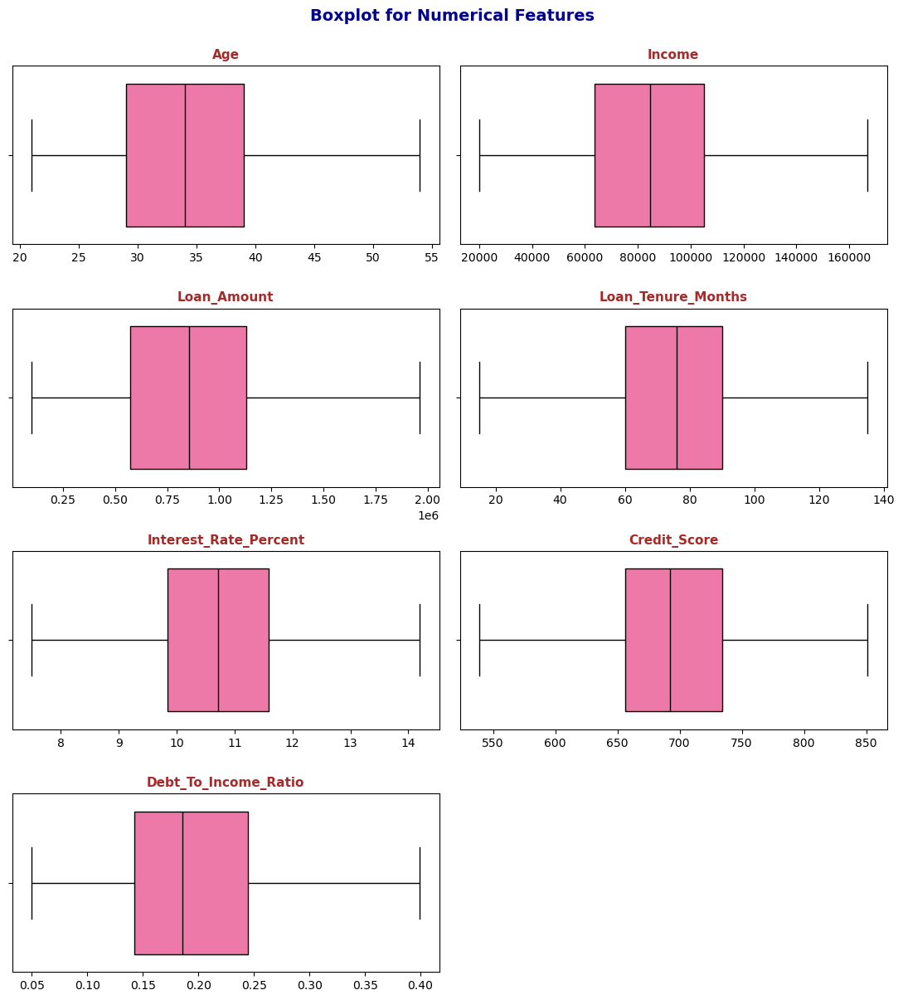

In [49]:
# Plotting boxplot for numerical columns to detect outliers

# Here we are creating subplots of boxplot with 2 rows and 2 columns in each row
fig , axes = plt.subplots(4, 2, figsize = (11, 12))
axes = axes.flatten()
for i, col in enumerate(num_cols):
    sns.boxplot(x=df[col], ax=axes[i], color='#ff66a3', linecolor='black')
    axes[i].set_title(col, fontsize=11, color='brown', fontweight='bold')
    axes[i].set_xlabel("")
fig.delaxes(axes[-1])
plt.suptitle('Boxplot for Numerical Features', fontsize=14, fontweight='bold', color='darkblue', y = 1)
plt.tight_layout()
plt.show()

In [50]:
# Using Interquartile range to check outliers after handling

for col in num_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    outliers = df[(df[col] < lower) | (df[col] > upper)]
    if not outliers.empty:
        print(f"Column '{col}' has {len(outliers)} outliers.")
    else:
        print(f"Column '{col}' has no outliers.")

Column 'Age' has no outliers.
Column 'Income' has no outliers.
Column 'Loan_Amount' has no outliers.
Column 'Loan_Tenure_Months' has no outliers.
Column 'Interest_Rate_Percent' has no outliers.
Column 'Credit_Score' has no outliers.
Column 'Debt_To_Income_Ratio' has no outliers.
Column 'Customer_Rating' has no outliers.


**`Now dataset has no outliers in any column.`**

#### **Generating Profile Report**

In [53]:
# Generating profile report after cleaning the dataset

Profile = ProfileReport(df)
Profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 18/18 [00:00<00:00, 127.50it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

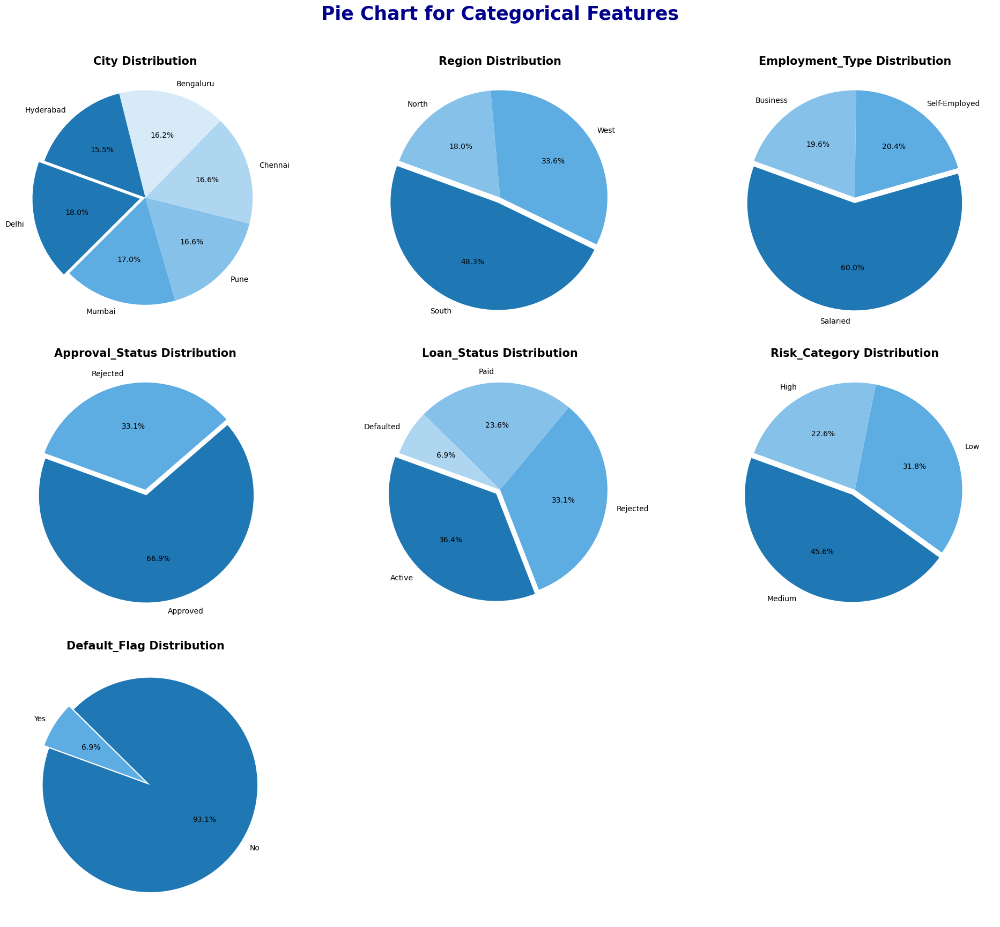

In [54]:
# Displaying pie chart to get distribution of categorical columns

cat_col = ['City',
 'Region',
 'Employment_Type',
 'Approval_Status',
 'Loan_Status',
 'Risk_Category','Default_Flag']

# Displaying pie chart to get distribution of categorical columns

# Create subplots: 3 rows, 3 columns (total 9 plots)
fig, axes = plt.subplots(3, 3, figsize=(20, 17))

# Flatten the 2D axes array into 1D for easy indexing
axes = axes.flatten()

# Defining the color palette
blue_colors = ['#1f77b4', '#5dade2', '#85c1e9', '#aed6f1', '#d6eaf8']

# Loop through each categorical column
for i, col in enumerate(cat_col):

    # Get count values for each category
    data = df[col].value_counts().values

    # Get category names
    labels = df[col].value_counts().index

    # Explode the category with maximum count
    explode = [0.05 if v == max(data) else 0 for v in data]

    # Plot pie chart on the specific subplot
    axes[i].pie(
        data,
        labels=labels,
        autopct='%1.1f%%',
        explode=explode,
        colors=blue_colors,
        startangle=160,
        radius=0.96
    )

    # Set title for each subplot
    axes[i].set_title(
        f'{col} Distribution',
        fontweight='bold',
        fontsize=15,
        y=0.96
    )

# Remove unused subplots (because we have only 7 categorical columns)
for j in range(len(cat_col), len(axes)):
    fig.delaxes(axes[j])

# Main title for the entire figure
plt.suptitle(
    'Pie Chart for Categorical Features',
    fontsize=25,
    fontweight='bold',
    color='darkblue',
    y=1.015
)

# Adjust layout to prevent overlap
plt.tight_layout()

# Display the plots
plt.show()


#### **Distribution of Categorical Columns**
##### **`City Distribution`**
- 18% observations are of Delhi, 17% of Mumbai, 16.6% of Pune as well as Chennai, 16.2% are of Bengaluru and 15.5% of Hyderabad.
##### **`Region Distribution`**
- 48.3% observations are of South region, 33.6% are of West and 18% are of North.
##### **`Employment Type Distribution`**
- 60% observations are of Salaried, 20.4% are of Self-employed and 19.6% are of Business.
##### **`Approval Status Distribution`**
- 66.9% applications are Approved, 33.1% applications are Rejected.
##### **`Loan Status Distribution`**
- 36.4% loans are Active, 33.1% are Rejected, 23.6% are Paid and 6.9% are Defaulted.
##### **`Risk category Distribution`**
- 71.5% of the records are of weekdays and 28.5% of the records are of weekends.
##### **`Default Flag Distribution`**
- 93.1% payments are repaid successfully if loan is approved and 6.9% are bad customers.

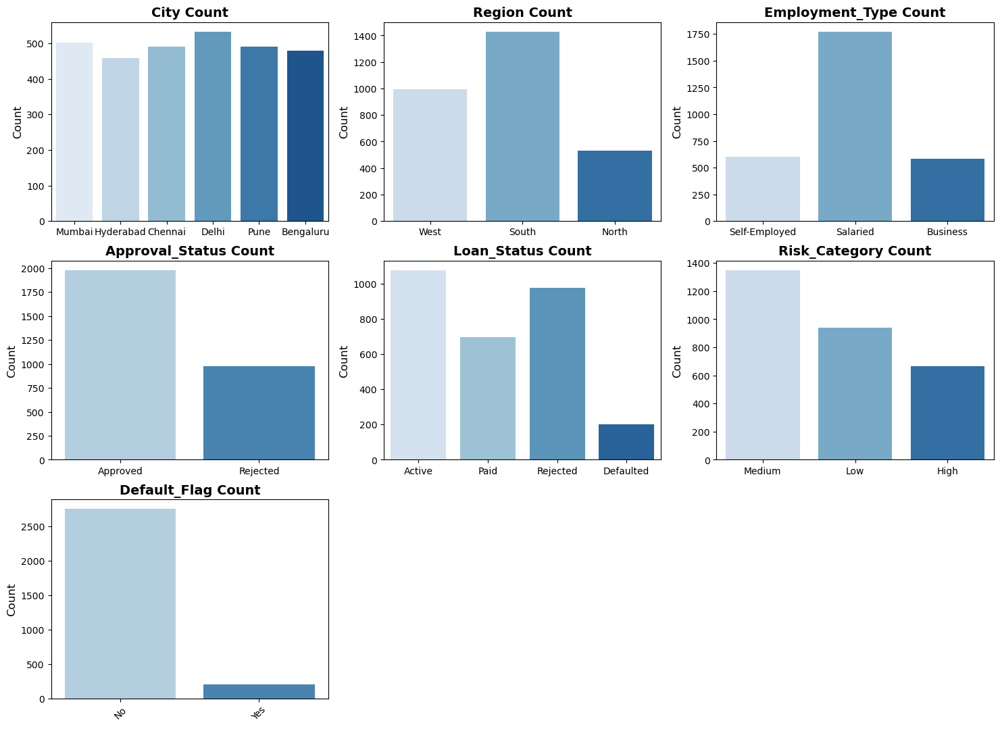

In [56]:
# Displaying countplot for categorical columns

# Create subplots: 3 rows, 3 columns
fig, axes = plt.subplots(3, 3, figsize=(18, 13)) 

# Flatten the 2D array of axes to 1D
axes = axes.flatten()

# Plot each categorical column
for i, col in enumerate(cat_col):
    sns.countplot(data=df, x=col, palette="Blues", ax=axes[i])
    axes[i].set_title(f'{col} Count', fontweight='bold', fontsize=14)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('Count', fontsize=12)

# Remove unused subplots (because we have only 7 categorical columns)
for j in range(len(cat_col), len(axes)):
    fig.delaxes(axes[j])

plt.xticks(rotation=45)
plt.show()

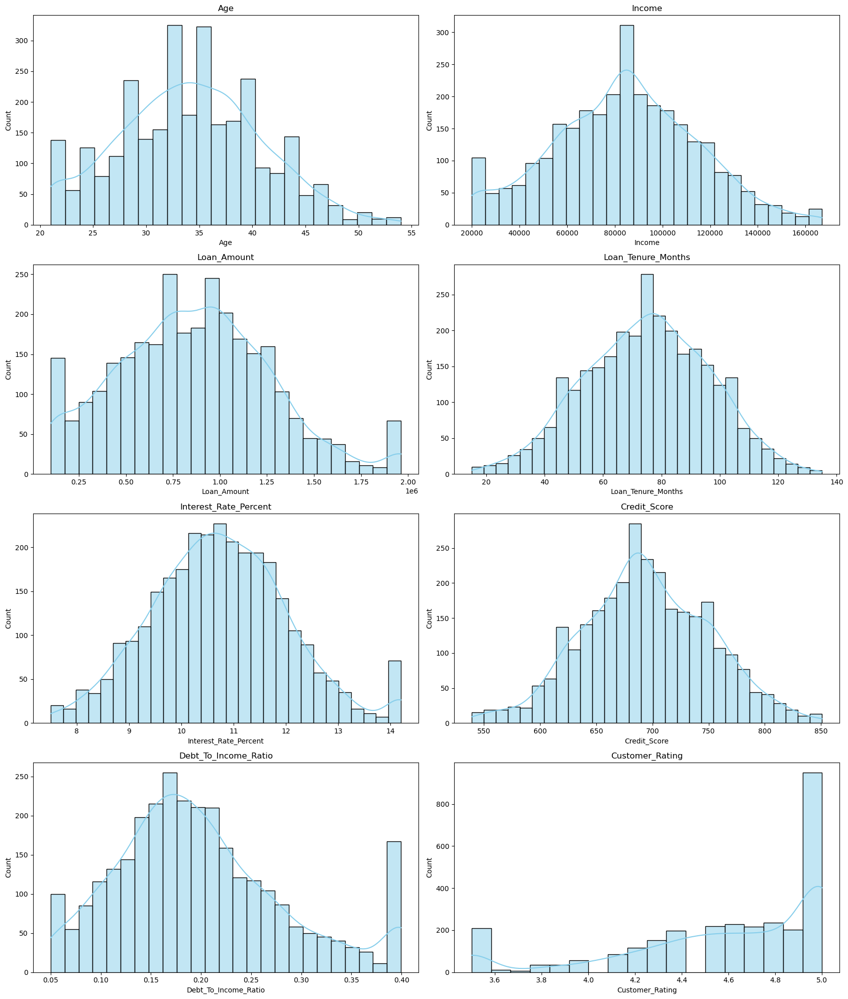

In [57]:
# Plotting histogram to check distribution of numerical columns

fig, axes = plt.subplots(4, 2, figsize=(17, 20))

axes = axes.flatten()
for i, col in enumerate(num_cols):
    sns.histplot(x=df[col], ax=axes[i], color='skyblue', kde=True)
    axes[i].set_title(col)

# Adjusting the layout so that the plots don't overlap with each other
plt.tight_layout()
plt.show()

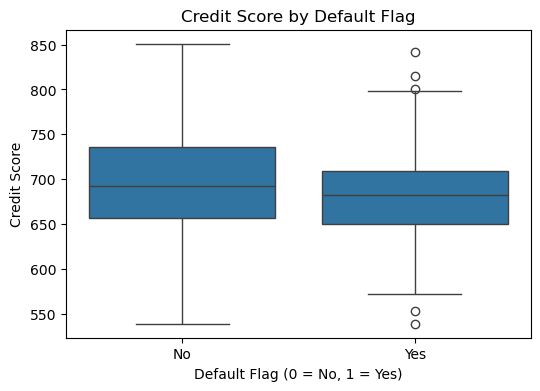

In [58]:
# Credit Score by Default Flag

plt.figure(figsize=(6,4))
sns.boxplot(x='Default_Flag', y='Credit_Score', data=df)
plt.title('Credit Score by Default Flag')
plt.xlabel('Default Flag (0 = No, 1 = Yes)')
plt.ylabel('Credit Score')
plt.show()

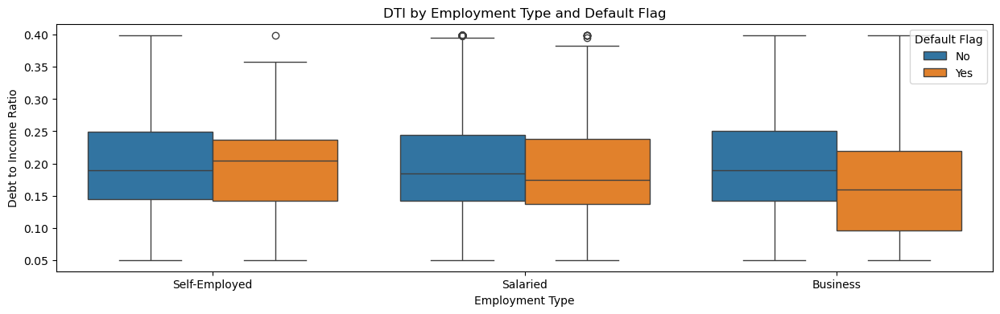

In [59]:
# DTI by Default_Flag & Employment_Type (Box plot)

plt.figure(figsize=(15,4))
sns.boxplot(x='Employment_Type', y='Debt_To_Income_Ratio',hue='Default_Flag', data=df)
plt.title('DTI by Employment Type and Default Flag')
plt.xlabel('Employment Type')
plt.ylabel('Debt to Income Ratio')
plt.legend(title='Default Flag')
plt.show()

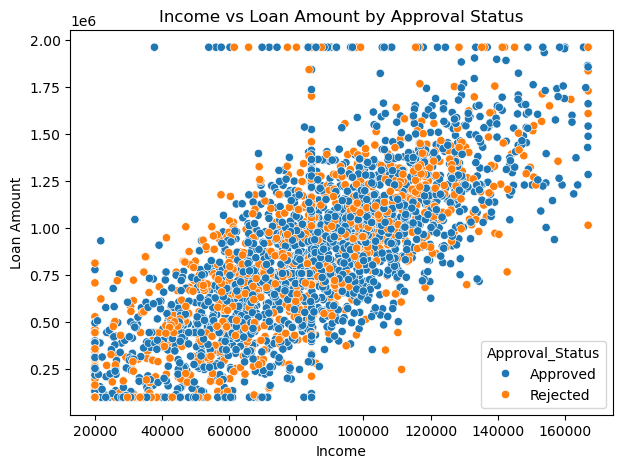

In [60]:
# Income vs Loan_Amount (Scatter plot)

plt.figure(figsize=(7,5))
sns.scatterplot(x='Income', y='Loan_Amount',
                hue='Approval_Status', data=df)
plt.title('Income vs Loan Amount by Approval Status')
plt.xlabel('Income')
plt.ylabel('Loan Amount')
plt.show()

In [61]:
# Crosstab shows how two variables relate to each other

pd.crosstab(df['Default_Flag'], df['Loan_Status'])

Loan_Status,Active,Defaulted,Paid,Rejected
Default_Flag,,,,
No,1077,0,698,978
Yes,0,203,0,0


In [62]:
pd.crosstab(df['Default_Flag'], df['Income_Category'])

Income_Category,Low,Medium,High,Very High
Default_Flag,,,,
No,689,728,640,696
Yes,50,71,39,43


In [63]:
pd.crosstab(df['Default_Flag'], df['Risk_Category'])

Risk_Category,High,Low,Medium
Default_Flag,,,
No,618,907,1228
Yes,49,34,120


#### **Label Encoding**

In [65]:
# Nominal Label encoding for columns having no order

from sklearn.preprocessing import LabelEncoder  # import LabelEncoder from sklearn.preprocessing
le = LabelEncoder()  # initialize label encoder

# List of columns with categorical values
cols = ['Approval_Status','Default_Flag']

# Apply label encoding to each categorical column
for col in cols:
    df[col] = le.fit_transform(df[col])  # Convert categories to numbers

In [66]:
# Ordinal Label encoding for columns having order

from sklearn.preprocessing import OrdinalEncoder

risk_category = [['Low','Medium','High']]
income_category = [['Low','Medium','High','Very High']]

# Apply Ordinal Encoding to Risk Category column 
encoder = OrdinalEncoder(categories=risk_category)
df['Risk_Category'] = encoder.fit_transform(df[['Risk_Category']])

# Apply Ordinal Encoding to Income Category column 
encoder = OrdinalEncoder(categories=income_category)
df['Income_Category'] = encoder.fit_transform(df[['Income_Category']])

In [67]:
# Applying one hot encoding on column ChestPainType and RestingECG

# Importing one hot encoder 
from sklearn.preprocessing import OneHotEncoder

# categorical columns on which we have to apply one hot encoding
cat_cols = ['City','Region','Employment_Type','Loan_Status']

# Initializing One Hot Encoder
encoder = OneHotEncoder(sparse_output=False)

# apply encoding only on categorical columns
encoded_array = encoder.fit_transform(df[cat_cols])

# convert encoded output to DataFrame
encoded_df = pd.DataFrame(
    encoded_array,
    columns=encoder.get_feature_names_out(cat_cols),
    index=df.index
)

# drop original categorical columns
df = df.drop(columns=cat_cols)

# combine numeric + encoded columns
df = pd.concat([df, encoded_df], axis=1)

# Displaying first five rows
df.head()


,Age,Income,Loan_Amount,Loan_Tenure_Months,Interest_Rate_Percent,Credit_Score,Debt_To_Income_Ratio,Approval_Status,Default_Flag,Customer_Rating,Risk_Category,Year,Month,Income_Category,City_Bengaluru,City_Chennai,City_Delhi,City_Hyderabad,City_Mumbai,City_Pune,Region_North,Region_South,Region_West,Employment_Type_Business,Employment_Type_Salaried,Employment_Type_Self-Employed,Loan_Status_Active,Loan_Status_Defaulted,Loan_Status_Paid,Loan_Status_Rejected
0,43.0,90322.0,980052.0,84.0,10.92,672.0,0.1850,0,0,4.1,1.0,2023,8,2.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0
1,28.0,32617.0,488350.0,54.0,9.99,698.0,0.3450,0,0,4.6,1.0,2024,11,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
2,34.0,86468.0,954165.0,53.0,11.56,709.0,0.3995,1,0,4.4,1.0,2024,3,2.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
3,33.0,110760.0,1298938.0,59.0,8.36,730.0,0.2430,0,0,5.0,0.0,2023,4,3.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0
4,37.0,141338.0,1627058.0,110.0,10.14,767.0,0.1610,0,0,4.5,0.0,2023,5,3.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0


#### **Correlation Heatmap**

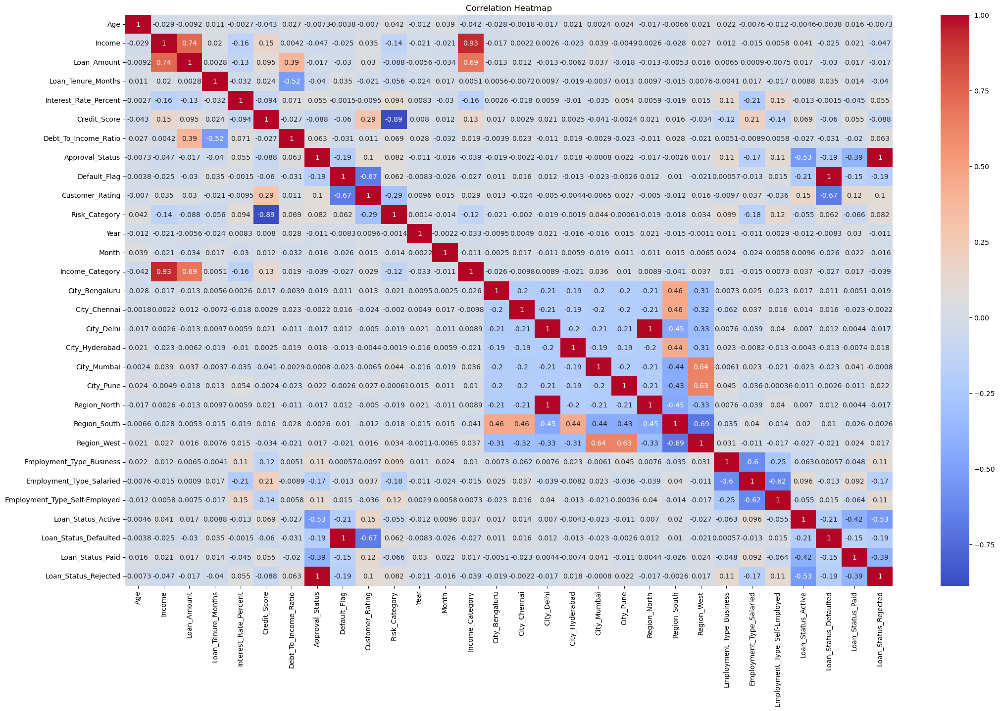

In [69]:
# Displaying correlation heatmap 

cols = df.columns
plt.figure(figsize=(25, 15))
sns.heatmap(df[cols].corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

In [70]:
# Dropping 'Region_South', 'City_Pune', 'Employment_Type_Self-Employed', 'Loan_Status_Rejected' for avoiding dummy variable trap
df.drop(columns=['Region_South', 'City_Pune', 'Employment_Type_Self-Employed', 'Loan_Status_Rejected'], axis=1, inplace=True)


# Dropping column 'Income' due to multicolinearity
df.drop(columns=['Income'], axis=1, inplace=True)

#### **Handling Class Imbalance**

In [72]:
# Highly class imbalance in target column Default_Flag
# Here we are using oversampling which means generating synthetic records of minority class 

from imblearn.over_sampling import SMOTE
from collections import Counter

# Create SMOTE object
smote = SMOTE(random_state=42)

# Apply SMOTE to features and target
df_resampled, flag_resampled = smote.fit_resample(df.drop('Default_Flag', axis=1), df['Default_Flag'])

# Combine features and target into a new dataframe
df_balanced = pd.concat([df_resampled, flag_resampled], axis=1)

# Check class distribution before and after balancing
print('Before balancing :', Counter(df['Default_Flag']))         
print('After balancing :', Counter(df_balanced['Default_Flag']))

Before balancing : Counter({0: 2753, 1: 203})
After balancing : Counter({0: 2753, 1: 2753})


#### **Train-Test Split**

In [74]:
# Train test split

from sklearn.model_selection import train_test_split
x = df_balanced.drop('Default_Flag', axis=1)
y = df_balanced['Default_Flag']
X_train, X_test, y_train, y_test = train_test_split(x, y, random_state=42, stratify=y)

#### **Importing Necessary Libraries For Machine Learning Models**

In [76]:
# from sklearn we are importing evaluation metrics of supervised classification technique
from sklearn.metrics import (
    confusion_matrix,
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    roc_auc_score,
    roc_curve
)

from sklearn import metrics       # for confusion matrix
from sklearn.linear_model import LogisticRegression     # logistic regression
from sklearn.tree import DecisionTreeClassifier        # decision tree classifier
from xgboost import XGBClassifier                # xg boost classifier
from sklearn.ensemble import (
    RandomForestClassifier,                   # random forest classifier
    GradientBoostingClassifier                   # gradient boosting classifier
)
from sklearn.svm import SVC                      # support vector classifier 
from sklearn.naive_bayes import GaussianNB            # naive bayes
from sklearn.neighbors import KNeighborsClassifier         # k nearest neighbors

#### **Logistic Regression**

Logistic Regression
Accuracy score : 0.7160493827160493
Recall: 0.7412790697674418
F1: 0.7228915662650602
ROC-AUC: 0.7906681405474735


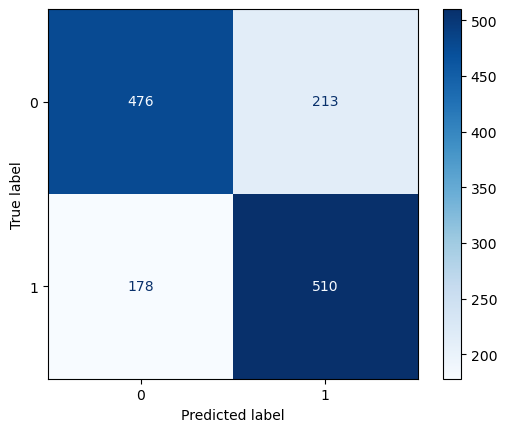

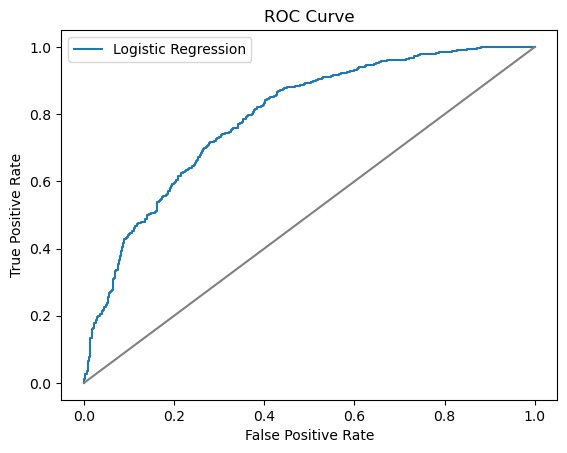

In [78]:
# Logistic Regression

lr_model = LogisticRegression()
lr_model.fit(X_train, y_train)
y_pred_lr = lr_model.predict(X_test)
y_prob_lr = lr_model.predict_proba(X_test)[:,1]
print('Logistic Regression')
print('Accuracy score :', accuracy_score(y_test, y_pred_lr))
print("Recall:", recall_score(y_test, y_pred_lr))
print("F1:", f1_score(y_test, y_pred_lr))
print("ROC-AUC:", roc_auc_score(y_test, y_prob_lr))

# Confusion Matrix for Logistic Regression
confusion_matrix=metrics.confusion_matrix(y_test,y_pred_lr)
cm_display =metrics.ConfusionMatrixDisplay(confusion_matrix=confusion_matrix,display_labels=[0,1])
cm_display.plot(cmap="Blues")
plt.show()

fpr, tpr,_= roc_curve(y_test, y_prob_lr)
plt.plot(fpr, tpr, label="Logistic Regression")
plt.plot([0,1], [0,1], '-', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.show()

#### **Decision Tree Classifier**

Decision Tree Classifier
Accuracy: 1.0
Recall: 1.0
F1: 1.0
ROC-AUC: 1.0


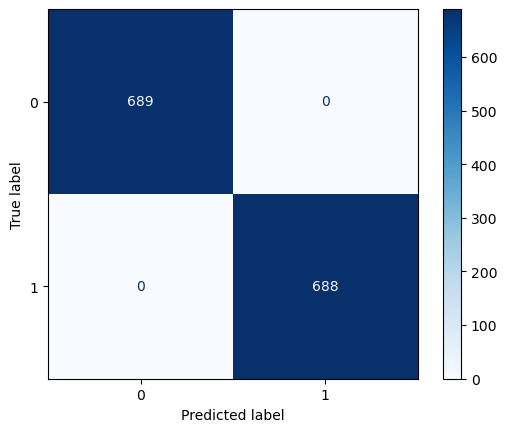

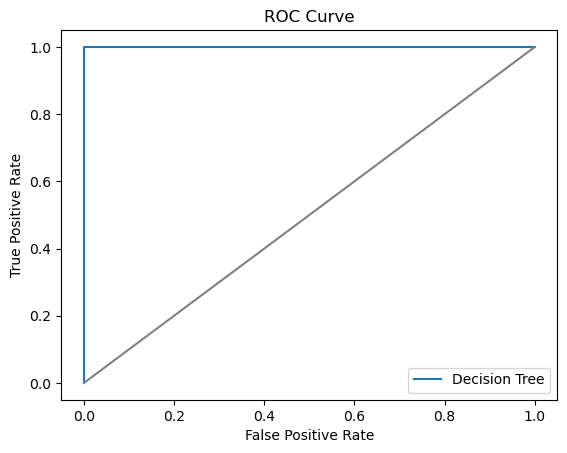

In [80]:
# Decision Tree Classifier

from sklearn.tree import DecisionTreeClassifier
dt_model = DecisionTreeClassifier()
dt_model.fit(X_train, y_train)
y_pred_dt = dt_model.predict(X_test)
y_prob_dt = dt_model.predict_proba(X_test)[:,1]
print('Decision Tree Classifier')
print("Accuracy:", accuracy_score(y_test, y_pred_dt))
print("Recall:", recall_score(y_test, y_pred_dt))
print("F1:", f1_score(y_test, y_pred_dt))
print("ROC-AUC:", roc_auc_score(y_test, y_prob_dt))

# Confusion Matrix for Decision Tree Classifier
confusion_matrix=metrics.confusion_matrix(y_test,y_pred_dt)
cm_display =metrics.ConfusionMatrixDisplay(confusion_matrix=confusion_matrix,display_labels=[0,1])
cm_display.plot(cmap="Blues")
plt.show()


fpr, tpr,_= roc_curve(y_test, y_prob_dt)
plt.plot(fpr, tpr, label="Decision Tree")
plt.plot([0,1], [0,1], '-', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.show()

#### **Random Forest Classifier**

Random Forest Classifier
Accuracy: 1.0
Recall: 1.0
F1: 1.0
ROC-AUC: 1.0


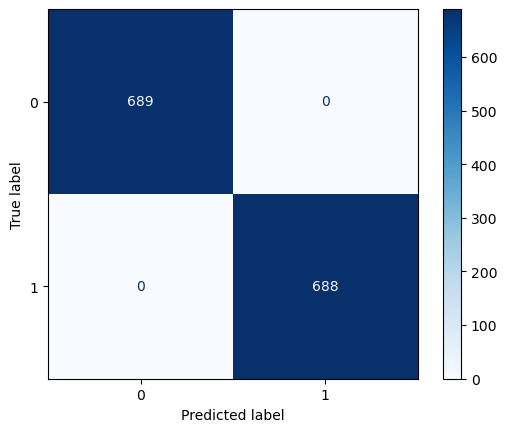

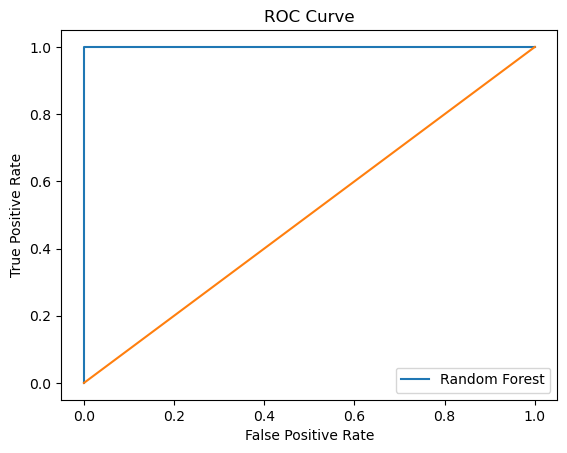

In [82]:
# Random Forest Classifier

rf_model = RandomForestClassifier(n_estimators=100)
rf_model.fit(X_train, y_train)
y_pred_rf = rf_model.predict(X_test)
y_prob_rf = rf_model.predict_proba(X_test)[:,1]
print('Random Forest Classifier')
print("Accuracy:", accuracy_score(y_test, y_pred_rf))
print("Recall:", recall_score(y_test, y_pred_rf))
print("F1:", f1_score(y_test, y_pred_rf))
print("ROC-AUC:", roc_auc_score(y_test, y_prob_rf))

# Confusion Matrix for Random Forest Classifier
confusion_matrix=metrics.confusion_matrix(y_test,y_pred_rf)
cm_display =metrics.ConfusionMatrixDisplay(confusion_matrix=confusion_matrix,display_labels=[0,1])
cm_display.plot(cmap="Blues")
plt.show()

fpr, tpr,_= roc_curve(y_test, y_prob_rf)
plt.plot(fpr, tpr, label="Random Forest")
plt.plot([0,1], [0,1], '-')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.show()

#### **KNN Classifier**

Accuracy: 0.6252723311546841
Recall: 0.6438953488372093
F1: 0.6319543509272468
ROC-AUC: 0.6941324636311472


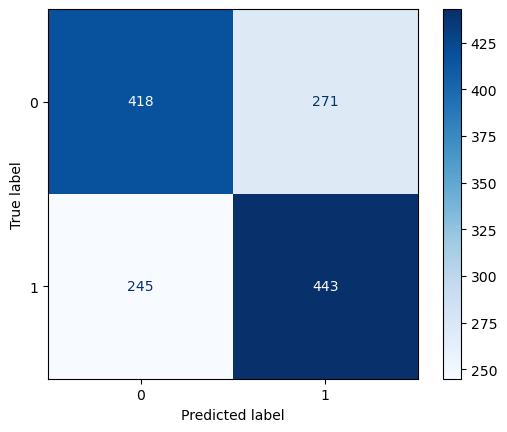

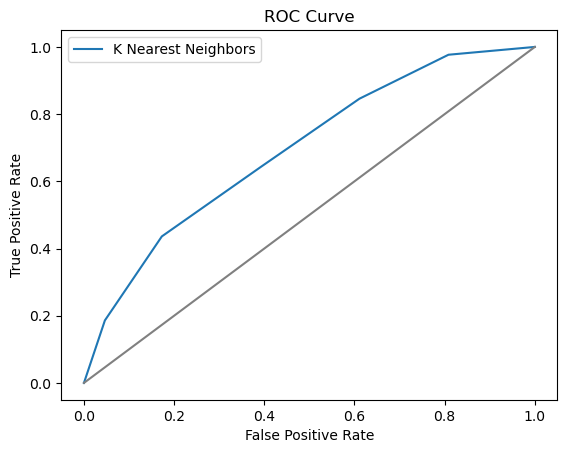

In [84]:
# K Nearest Neighbors Classifier 

knn_model = KNeighborsClassifier()
knn_model.fit(X_train, y_train)
y_pred_knn = knn_model.predict(X_test)
y_prob_knn = knn_model.predict_proba(X_test)[:,1]
print("Accuracy:", accuracy_score(y_test, y_pred_knn))
print("Recall:", recall_score(y_test, y_pred_knn))
print("F1:", f1_score(y_test, y_pred_knn))
print("ROC-AUC:", roc_auc_score(y_test, y_prob_knn))

# Confusion Matrix for KNN Classifier
confusion_matrix=metrics.confusion_matrix(y_test,y_pred_knn)
cm_display =metrics.ConfusionMatrixDisplay(confusion_matrix=confusion_matrix,display_labels=[0,1])
cm_display.plot(cmap="Blues")
plt.show()

fpr, tpr,_= roc_curve(y_test, y_prob_knn)
plt.plot(fpr, tpr, label="K Nearest Neighbors")
plt.plot([0,1], [0,1], '-', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.show()

#### **Naive Bayes**

Naive Bayes Classifier
Accuracy: 0.6463326071169209
Recall: 0.8459302325581395
F1: 0.7050272562083586
ROC-AUC: 0.6928160968035912


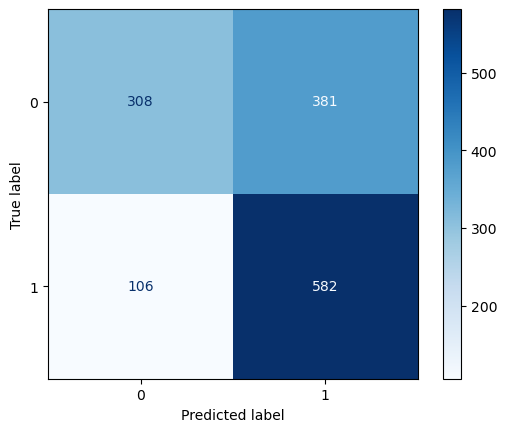

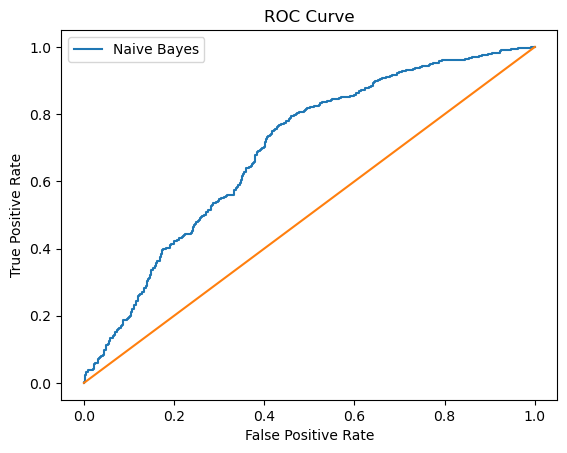

In [86]:
# Naive Bayes

naive_model = GaussianNB()
naive_model.fit(X_train, y_train)
y_pred_naive = naive_model.predict(X_test)
y_prob_naive = naive_model.predict_proba(X_test)[:,1]
print('Naive Bayes Classifier')
print("Accuracy:", accuracy_score(y_test, y_pred_naive))
print("Recall:", recall_score(y_test, y_pred_naive))
print("F1:", f1_score(y_test, y_pred_naive))
print("ROC-AUC:", roc_auc_score(y_test, y_prob_naive))

# Confusion Matrix for Naive Bayes Classifier
confusion_matrix=metrics.confusion_matrix(y_test, y_pred_naive)
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix=confusion_matrix,display_labels=[0,1])
cm_display.plot(cmap="Blues")
plt.show()

fpr, tpr,_= roc_curve(y_test, y_prob_naive)
plt.plot(fpr, tpr, label="Naive Bayes")
plt.plot([0,1], [0,1], '-')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.show()

#### **Support Vector Classifier**

Accuracy: 0.55119825708061
Recall: 0.5988372093023255
F1: 0.5714285714285714
ROC-AUC: 0.5402398994160732


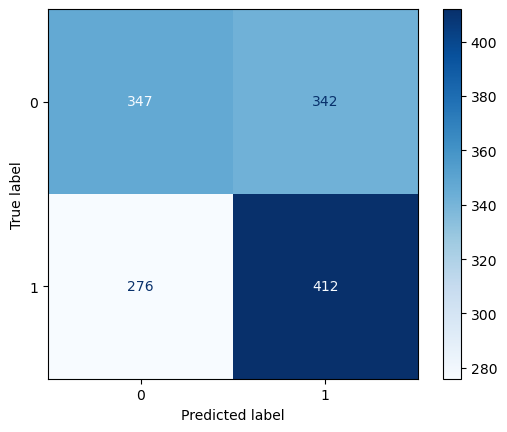

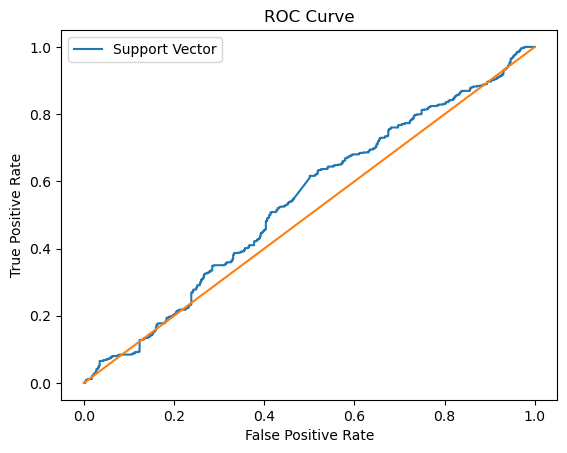

In [88]:
# Support Vector Classifier

svc_model = SVC(probability=True)
svc_model.fit(X_train, y_train)
y_pred_svc = svc_model.predict(X_test)
y_prob_svc = svc_model.predict_proba(X_test)[:,1]
print("Accuracy:", accuracy_score(y_test, y_pred_svc))
print("Recall:", recall_score(y_test, y_pred_svc))
print("F1:", f1_score(y_test, y_pred_svc))
print("ROC-AUC:", roc_auc_score(y_test, y_prob_svc))

# Confusion Matrix for Support Vector Classifier
confusion_matrix=metrics.confusion_matrix(y_test, y_pred_svc)
cm_display =metrics.ConfusionMatrixDisplay(confusion_matrix=confusion_matrix,display_labels=[0,1])
cm_display.plot(cmap="Blues")
plt.show()

fpr, tpr,_= roc_curve(y_test, y_prob_svc)
plt.plot(fpr, tpr, label="Support Vector")
plt.plot([0,1], [0,1], '-')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.show()

#### **XG Boost Classifier**

Accuracy: 1.0
Recall: 1.0
F1: 1.0
ROC-AUC: 1.0


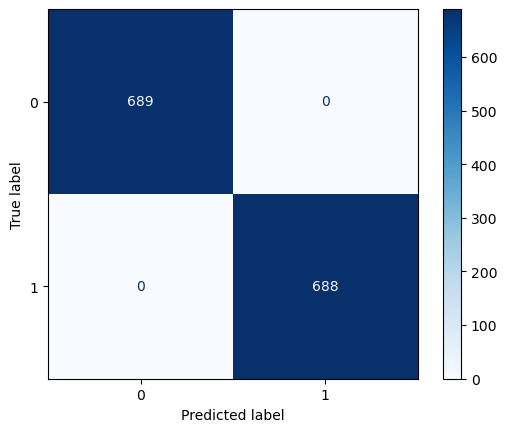

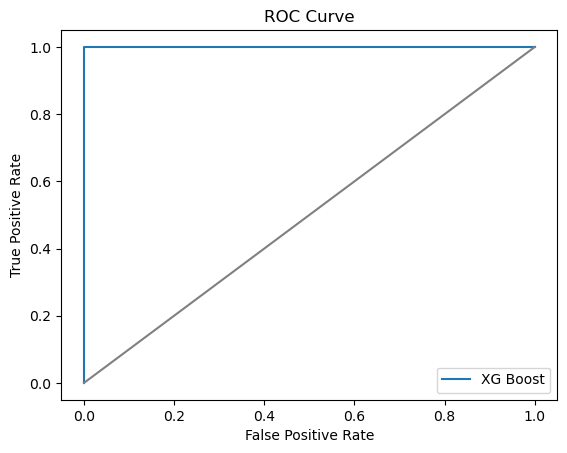

In [90]:
# XG Boost Classifier

xgb_model = XGBClassifier()
xgb_model.fit(X_train, y_train)
y_pred_xgb = xgb_model.predict(X_test)
y_prob_xgb = xgb_model.predict_proba(X_test)[:,1]
print("Accuracy:", accuracy_score(y_test, y_pred_xgb))
print("Recall:", recall_score(y_test, y_pred_xgb))
print("F1:", f1_score(y_test, y_pred_xgb))
print("ROC-AUC:", roc_auc_score(y_test, y_prob_xgb))

# Confusion Matrix for XG Boost Classifier
confusion_matrix=metrics.confusion_matrix(y_test, y_pred_xgb)
cm_display =metrics.ConfusionMatrixDisplay(confusion_matrix=confusion_matrix,display_labels=[0,1])
cm_display.plot(cmap="Blues")
plt.show()

fpr, tpr,_= roc_curve(y_test, y_prob_xgb)
plt.plot(fpr, tpr, label="XG Boost")
plt.plot([0,1], [0,1], '-', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.show()